# Working with Geospatial Data in Python
GCER Lab - Mississippi State University Department of Ag & Bio Engineering

Author: [Dakota Hester](mailto:dh2306@msstate.edu)

Date: June 24, 2024

## Background
While desktop geospatial software suites (such as ArcGIS and QGIS) have long been the norm for creating and manipulating GIS data, they are somewhat limited by the GUI approach to interacting with data. For example, suppose we want to analyze a large amount of raster data split into 10,000 different files. This can be done in ArcGIS using the ModelBuilder and Batch Processing tools, but doing so is often a clunky process. Further, if we want to leverage data tools from another source (i.e., a deep learning model), we are limited by the tools included in the software suite or its extensions. In essence, while most GUI-based GIS software is powerful and user-friendly (especially when it comes to creating and visualizing data), it is rarely the best choice for complex data analysis tasks that require automation, scalability, and reproducibility.

Thanks to open-source libraries built specifically for geospatial data, we can perform a wide range of tasks in Python that are repeatable, sharable, scalable, and highly configurable. Owing to the prevalence of Python in the data science community, we can use these libraries in conjunction with other libraries for data analysis, machine learning, and visualization. The goal of this notebook is to serve as a gentle introduction to geospatial data types in Python, and how we can leverage Python libraries to manipulate and analyze geospatial data.

## Common libraries for data and numerical analysis

Before we begin, let's review some common libraries used for general purpose data analysis in Python. These packages are not necessarily specific to geospatial data, but they are widely used for many other data purposes. Owing to their flexibility and interoperability with many other libraries, libraries for geospatial data often use these packages as the base data structure.

### Numpy

Numpy is among the most popular Python packages for numerical computing. It defines an `array` datatype for storing multi-dimensional data, and offers a variety of functions for performing operations on the arrays. In addition to mathematical operations (`dot`, `mean`, `exp`), Numpy also provides functions for manipulating the structure of an array (`reshape`, `transpose`, `squeeze`), and for indexing and slicing arrays. Numpy arrays are the base data structure for a wide range of other Python libraries since they are generic enough to represent many types of data while simultaneously offering a wide range of operations for working with that data efficiently.

In [262]:
import numpy as np

my_array = np.array([1, 2, 3, 4, 5]) # basic 1-D numpy array
print('my_array sum', my_array.sum())
print('my_array reshaped', my_array.reshape(1, 5)) # reshape into 2-D array

# numpy arrays can only contain one type of data
print('my_array dtype', my_array.dtype)

my_array sum 15
my_array reshaped [[1 2 3 4 5]]
my_array dtype int64


Numpy provides highly efficient implementations of many mathematical functions that operate on arrays. Because of this, it is well-suited for imagery/raster data, which is often represented as a multi-dimensional array. 

### Pandas

Pandas is a Python library for working with tabular data (i.e., data that is stored in row-column format where each row is an observation and each column corresponds to a variable). The `DataFrame` data type implements a two-dimensional labeled data structure where data types can vary across columns. Pandas provides numerous functions for reading and writing data from various sources (CSV, Excel, SQL, etc.), for cleaning and transforming data, and for performing operations on the data (grouping, merging, reshaping, etc.).

We won't discuss Pandas in detail in this notebook, but it is worth mentioning due to its wide use in data science workflows. In particular, the `Series` and `DataFrame` data types are subclassed by the `GeoSeries` and `GeoDataFrame` data types in the `geopandas` library for working with vector data, which we will discuss later.

In [263]:
import pandas as pd

# basic pandas series - similar to a 1-D numpy array. series must contain data 
# of the same type. a series can be thought of as a single column of a table
my_series = pd.Series([10, 20, 30, 40, 50], name='my_series')
print('my_series sum', my_series.sum())
print('my_series mean', my_series.mean())

# create a pandas dataframe with some dummy data. DataFrames are comprised of multiple Series objects
my_df = pd.DataFrame({
    'county': ['Oktibbeha', 'Hinds', 'Rankin', 'Madison', 'Lauderdale'],
    'avg_income': [60000, 50000, 70000, 80000, 40000],
    'avg_age': [30, 35, 40, 45, 50],
    'population': [100000, 200000, 300000, 400000, 500000]
})

print('Oktibbeha county average age:', my_df[my_df['county'] == 'Oktibbeha']['avg_age'].values[0]) # select row containing data for Oktibbeha county and get the avg_age value
print(f'Total population across all {len(my_df)} counties:', my_df['population'].sum()) # sum the population column
print('Pearson correlation between avg_income and avg_age:', my_df['avg_income'].corr(my_df['avg_age'])) # calculate the correlation between avg_income and avg_age

my_series sum 150
my_series mean 30.0
Oktibbeha county average age: 30
Total population across all 5 counties: 1500000
Pearson correlation between avg_income and avg_age: -0.1


### Matplotlib

Matplotlib is a Python library for visualizing data. Matplotlib can generate many types of visualizations for a wide range of purposes, including static plots and graphs, animated and interactive figures, maps, 3-D representations, and more. Matplotlib borrows many conventions from MATLAB, making its syntax familiar for users who have worked with MATLAB in the past - though among the most common complaints pertaining to Matplotlib is its syntax, which some users find overly complicated and non-pythonic. Nevertheless, Matplotlib is a powerful, highly customizable, and extensively-used library for data visualization in Python, and basic familiarity with it is essential for visualizing geospatial data.

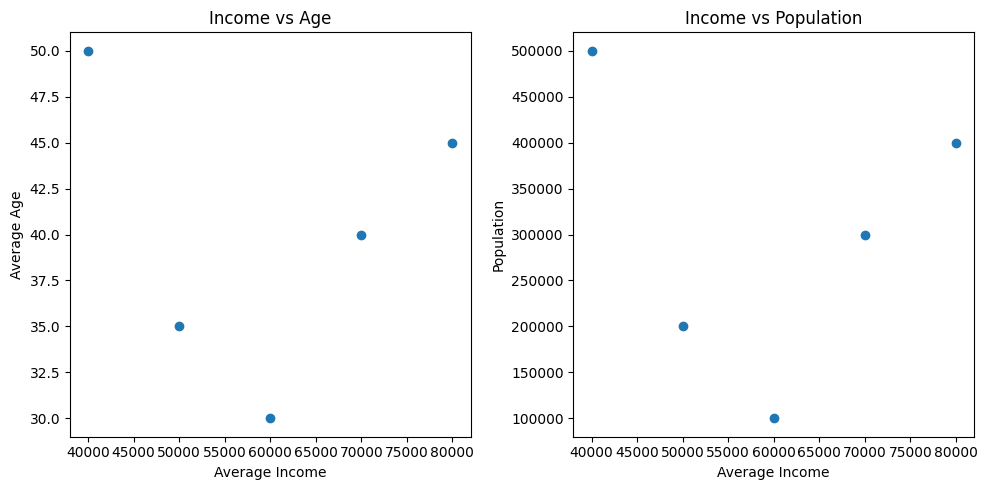

In [264]:
import matplotlib.pyplot as plt

# create a subplot with 1 row and 2 columns
fig, ax = plt.subplots(1, 2, figsize=(10, 5))

# plot the avg_income and avg_age columns on the first subplot
ax[0].scatter(my_df['avg_income'], my_df['avg_age'])
ax[0].set_xlabel('Average Income')
ax[0].set_ylabel('Average Age')
ax[0].set_title('Income vs Age')

# plot the avg_income and population columns on the second subplot
ax[1].scatter(my_df['avg_income'], my_df['population'])
ax[1].set_xlabel('Average Income')
ax[1].set_ylabel('Population')
ax[1].set_title('Income vs Population')

fig.tight_layout() # automatically adjust positions of figure elements to best fit everything
plt.show() # display the plot

## Geospatial libraries

Now that we have reviewed some libraries for general data analysis and their core data structures, we can start to look at libraries that enable use to plug geospatial data into these workflows. We'll break this down into two sections - one for vector data (points, lines, polygons) and one for raster data (imagery, elevation data, etc.).



### Vector data

Vector data refers to any data type that can be represented by discrete points, lines, or polygons in space. For example, the latitude and longitude of a location can be represented as a point, roads and waterways can be represented as lines which consist of multiple points, and the footprint of a building or boundary of a county can be represented as a polygon that consists of multiple lines that form a closed shape. Vector data consists of one or more of these types of geometries along with the associated attributes or properties of the geometry. For example, geometry representing a city might be a polygon that has attributes such as the city's name, population, elevation, etc.

#### Shapely

The most commonly used data structure for representing vector data in Python comes from the Shapely library. The shapely library provides a `Point`, `LineString`, and `Polygon` data type for representing points, lines, and polygons, respectively. We can use these data types to create individual geometries and manipulate them in various ways. We can also use shapely to compare geometries, calculate distances between them, and perform other geometric operations.

##### A note on geometry coordinates

Shapely is used to represent geometries in 2-D space, and it carries no information about the projection or coordinate reference system (CRS) of the data. When creating geometries, Shapely uses a pair of Cartesian coordinates (or a list of pairs for lines and polygons) to represent the geometry. These coordinates are in euclidean space, and the units themselves are arbitrary. This can be confusing as we often describe a location using latitude/longitude coordinates, whereas Shapely accepts coordinates in X/Y space. Thus, when defining geometries in Shapely using geospatial coordinates, we must ensure that we provide them in (longitude, latitude) order, rather than (latitude, longitude) order since longitude refers to the X-position of a location with respect to the Prime meridian while the latitude refers to the Y-position of said location with respect to the equator.  We will discuss converting between different coordinate systems later in this notebook.

Area of my_polygon: 9.999999992137419e-11
Length of my_line: 2.828427123634253e-05
Bounding box of my_polygon: (-88.792992, 33.453333, -88.792972, 33.453343)
Does my_point intersect my_line? False
Distance between my_point and my_line: 1.0000000003174137e-05


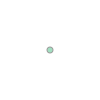

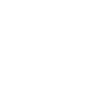

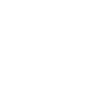

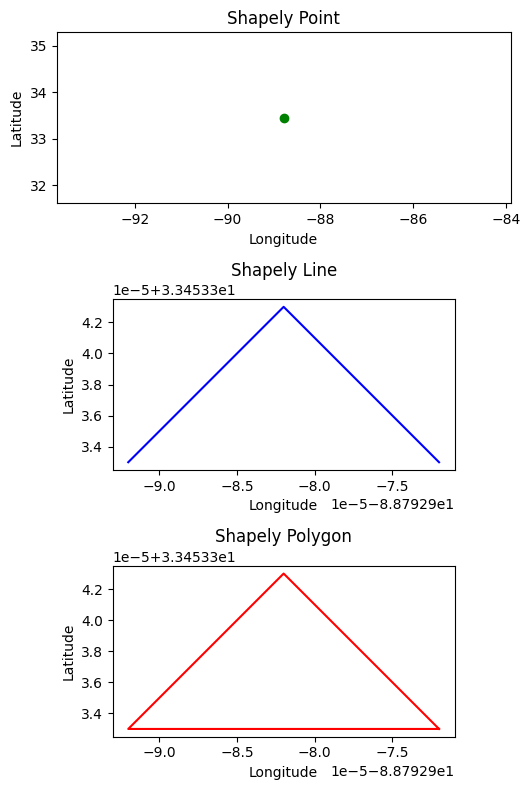

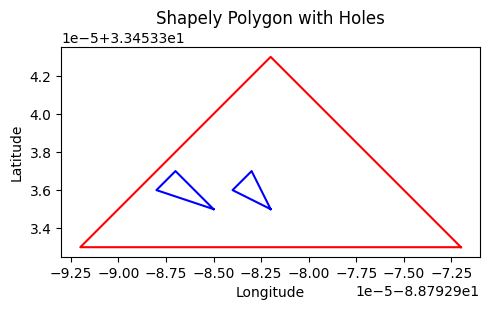

In [265]:
import shapely.geometry

my_point = shapely.geometry.Point(-88.792972, 33.453323)
my_line = shapely.geometry.LineString([
    (-88.792972, 33.453333), 
    (-88.792982, 33.453343), 
    (-88.792992, 33.453333)
])

# polygon coordinates are same as line coordinates, but they form a closed shape (last point is same as first point)
my_polygon = shapely.geometry.Polygon([
    (-88.792972, 33.453333), 
    (-88.792982, 33.453343), 
    (-88.792992, 33.453333), 
    (-88.792972, 33.453333)
])

# shapely can help us calculate areas, lengths, and other geometric properties
print('Area of my_polygon:', my_polygon.area)
print('Length of my_line:', my_line.length)
print('Bounding box of my_polygon:', my_polygon.bounds)

# can also examine relationships between shapely objects
print('Does my_point intersect my_line?', my_point.intersects(my_line))
print('Distance between my_point and my_line:', my_point.distance(my_line))

# use ipython display funciton to show shapely objects in Jupyter notebooks
display(my_point)
display(my_line)
display(my_polygon)

# matplotlib can also be used to plot shapely objects
fig, ax = plt.subplots(3, 1, figsize=(10, 8))

ax[0].scatter(*my_point.xy, color='green')
ax[0].set_title('Shapely Point')

ax[1].plot(*my_line.xy, color='blue')
ax[1].set_title('Shapely Line')

ax[2].plot(*my_polygon.exterior.xy, color='red')
ax[2].set_title('Shapely Polygon')

for a in ax:
    a.set_aspect('equal') # make sure x and y axes have same scale
    a.set_xlabel('Longitude')
    a.set_ylabel('Latitude')

fig.tight_layout()
plt.show()

# polygons can also have interior holes
my_polygon_with_hole = shapely.geometry.Polygon(
    shell=[
        (-88.792972, 33.453333), 
        (-88.792982, 33.453343), 
        (-88.792992, 33.453333), 
        (-88.792972, 33.453333)
    ], 
    holes=[
        [
            (-88.792985, 33.453335), 
            (-88.792988, 33.453336),
            (-88.792987, 33.453337),
            (-88.792985, 33.453335),
        ], 
        [
            (-88.792982, 33.453335), 
            (-88.792984, 33.453336),
            (-88.792983, 33.453337),
            (-88.792982, 33.453335),
        ], 
    ]
)

fig, ax = plt.subplots(1, 1, figsize=(5, 5))

# working with polygons with holes can be a bit tricky, but matplotlib can plot them
ax.plot(*my_polygon_with_hole.exterior.xy, color='red') # plot the exterior first
for hole in my_polygon_with_hole.interiors:
    ax.plot(*hole.xy, color='blue') # not plot the holes

ax.set_aspect('equal')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
ax.set_title('Shapely Polygon with Holes')

fig.tight_layout()
plt.show()

#### Pyproj

Pyproj is a popular Python library for transforming geospatial data between different coordinate systems. The importance of Pyproj cannot be overstated, since converting data between different coordinate systems is a common task in geospatial analysis. Before we can dive into the details of Pyproj, we need to understand what a coordinate system is and why we need to convert between them.

##### Geographic Coordinate Systems and their limitations

So far we have looked at geometries in geographic coordinate system (GCS) using latitude and longitude coordinates. Indeed, for most purposes storing objects using their cartesian coordinates is sufficient (see the [well-known text (WKT)](https://en.wikipedia.org/wiki/Well-known_text_representation_of_geometry) and [GeoJson](https://en.wikipedia.org/wiki/GeoJSON)) format specifications for examples). However, working with geospatial data in geographic coordinate systems is usually suboptimal for several reasons:

* GCSs are defined on a spheroid, often using angular units such as degrees. More often than not, degree units are near meaningless for measuring distances or areas. For example, a degree of latitude is not the same distance as a degree of longitude, and the length of a degree of longitude along the Earth's surface varies with latitude. That is to say, as we get further from the equator, the "actual" distance (along the Earth's surface) of a degree of longitude decreases. See the image below for a visualization of this concept - look at how lines of latitude converge as they move towards the poles.

![Visualization of a GCS on an ellipsoid. Source: ESRI](./images/gcs_coords.jpg)
Visualization of a GCS on an ellipsoid. Source: ESRI

* Visualizing data in GCSs can be challenging, as the projecting the data onto a 2-D plane *will* lead to distortion. For example, the Mercator projection is a common projection used for navigational purposes as it shows lines of constant bearing as straight lines. However, it leads to serious distortion in the size of objects (i.e., Greenland is actually much smaller than Africa, but it appears larger on a map using the Mercator projection).

![Mercator projection of the world. Source: Wikipedia](./images/Mercator_projection_Square.JPG)
Mercator projection of the world. Source: Wikipedia

* When calculating distances between points, areas of polygons, or other geometric properties in a GCS, we need to account for the curvature of the Earth. This is especially important when working with data that covers a large area, as error introduced by assuming a flat Earth can be significant.

##### A note on GCSs

GCSs rely on an ellipsoid model to represent the Earth's shape and a "datum" that defines how the coordinates are positioned on the model. By far the most common datum is the World Geodetic System 1984 (WGS84), which used by GPS systems and is the default datum for most geospatial data. The technical details of datums and GCS specifications are far beyond the scope of this notebook (and my knowledge for that matter - coordinate systems are a highly complex topic that relies on a deep understanding of geodesy). For most purposes, if your data is in latitude and longitude, it is likely to be in the WGS84 GCS and rely on the WGS84 datum.

##### Projected Coordinate Systems

To address the issues that arise from the Earth's curvature, we can simplify our analysis by projecting our data onto a 2-D plane. The properties of this 2-D plane can be chosen to minimize the effects of distortion and enable us to perform calculations using units that are more meaningful for most analysis (typically meters). A projected coordinate system (PCS) defines how data is projected on this 2-D plane. We choose an appropriate PCS based on the region of interest and the area of the Earth's surface that we are working with. The most common family of PCSs is the Universal Transverse Mercator (UTM) system. UTM splits the Earth's surface into 60 zones that run north-south, with each zone being 6 degrees of longitude wide (with some exceptions). Each zone has its own PCS that projects the data onto a 2-D plane using a transverse Mercator projection. These zones are numbered from 1 to 60, with zone starting at 180 degrees west. Zones are further partitioned by the equator with PCSs being denoted with an N or S to indicate whether the PCS is in the northern or southern hemisphere. For example, most of Mississippi lies in UTM zone 16N.

![UTM zones across the globe. Source: Alan Morton (dmap.co.uk)](./images/utmworld.gif)
UTM zones across the globe. Source: Alan Morton (dmap.co.uk)

![UTM zones for the Conterminous United States. Source: Wikimedia Commons](./images/UTM_zones_NA.png)
UTM zones for the Conterminous United States. Source: Wikimedia Commons

##### Coordinate Reference Systems

A coordinate reference system (CRS) defines the coordinate system used to represent the data and/or project it onto a plane. A CRS can correspond to a GCS alone, or a PCS and the GCS that underlies it (since we need to define how coordinates relate to the Earth's surface before we can project them). For most cases, we usually define the CRS of the data and let the software handle the details of the GCS and/or PCS. However, it is important to understand the distinction between GCSs and PCSs, as well as the implications of working with data in different coordinate systems. [ESRI has a great blog post on this topic that dives into a little more detail.](https://www.esri.com/arcgis-blog/products/arcgis-pro/mapping/gcs_vs_pcs/)

As you can imagine, the technical details of CRSs and how they are defined can be quite complex. Thus, a majority of CRSs are assigned a unique identifier that can be used to identify the CRS without needing to know the details of the GCS and/or PCS. These identifiers are defined by the European Petroleum Survey Group (EPSG) and are known as EPSG codes. For example, the EPSG code for WGS84 is 4326, and the EPSG code for UTM zone 16N is 32616.

##### Converting between CRSs using Pyproj

Now that we have a basic understanding of CRSs, we can start to look at how we can transform geospatial data between CRSs using Pyproj. Pyproj defines a `Transformer` class that can handle the transformation of coordinates between different CRSs. This is invaluable when working with geospatial data, since data from different sources may be in different CRSs. It is *always necessary* to ensure that all data is in the same CRS before performing any analysis, and that the CRS used for analysis is appropriate for the region of interest.

Previously, we used Shapely to define geometries in a GCS. However, when we calculated the length of our line and the area of our polygon, Shapely assumed that the data was in a flat plane and did not account for the curvature of the Earth. In addition, Shapely does not assume any units for the coordinates so the results were returned in degrees (which as discussed earlier, are often not meaningful for most geographic analysis). To address these issues, we can use Pyproj to convert our data to a PCS that is appropriate for our region of interest. We can then use the transformed data to calculate the length of our line and the area of our polygon in meters.

The geometries we created earlier correspond to locations near Starkville, MS. To best represent these locations, we will convert our data from a GCS (WGS84) to a PCS (UTM zone 16N) using Pyproj. We can then perform geometric calculations on the data to obtain meaningful results.

Area of my_polygon_transformed: 1.031061426538567 meters
Length of my_line_transformed: 2.8943421527710393 meters
Distance between my_point_transformed and my_line_transformed: 1.109061591448836 meters


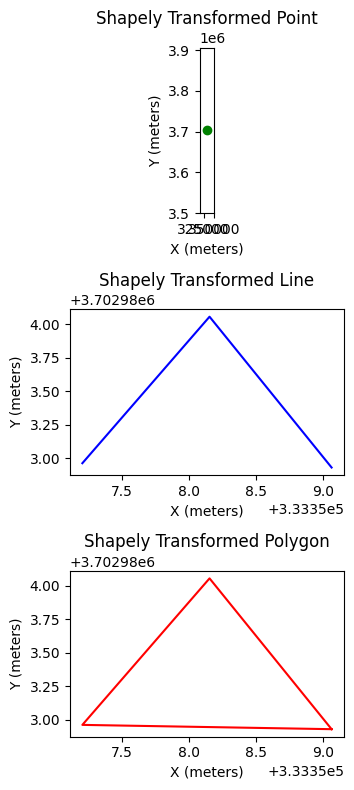

In [266]:
from pyproj import Transformer
# you can optionally use the `pyproj.transform` function to convert between CRSs 
# without creating a `Transformer` object, though I typically use the latter 
# since the `Transformer` object can be reused for multiple conversions

# pyproj does not directly support shapely objects, but in recent version of 
# shapely a utility function was added to help with this
from shapely.ops import transform

transformer = Transformer.from_crs(
    'epsg:4326', # WGS 84 (i.e., standard lat/lon in degrees)
    'epsg:32616', # UTM Zone 16N (meters)
    always_xy=True, # longitude first, latitude second (already defined our geometries this way earlier)
    area_of_interest=None, # can optioanally define an area of interest, not covered here
)

my_point_transformed = transform(transformer.transform, my_point)
my_line_transformed = transform(transformer.transform, my_line)
my_polygon_transformed = transform(transformer.transform, my_polygon)

# now we can look at properties of the transformed objects in meters
print('Area of my_polygon_transformed:', my_polygon_transformed.area, 'meters')
print('Length of my_line_transformed:', my_line_transformed.length, 'meters')
print('Distance between my_point_transformed and my_line_transformed:', my_point_transformed.distance(my_line_transformed), 'meters')

# now we can plot the transformed objects - note that the x and y axes are different
fig, ax = plt.subplots(3, 1, figsize=(10, 8))

ax[0].scatter(*my_point_transformed.xy, color='green')
ax[0].set_title('Shapely Transformed Point')

ax[1].plot(*my_line_transformed.xy, color='blue')
ax[1].set_title('Shapely Transformed Line')

ax[2].plot(*my_polygon_transformed.exterior.xy, color='red')
ax[2].set_title('Shapely Transformed Polygon')

for a in ax:
    a.set_aspect('equal') # make sure x and y axes have same scale
    a.set_xlabel('X (meters)')
    a.set_ylabel('Y (meters)')

fig.tight_layout()
plt.show()

#### Geopandas

Using shapely and pyproj, we can create and manipulate geometries for various analysis purposes. However, we often need to work with collections of geometries that represent features in the real world. Geometries (or "features" in GIS lingo) are very rarely the only component of vector data - most of the time we are interested in analyzing the properties associated with the geometry as well. Geopandas enables us to work with these collections of geometries and attributes in a tabular format. After all, geospatial data is just data with a spatial component - we can represent geospatial data as a table where each row (or observation) has some geometry associated with it. If you've used Pandas before, then you should have no problem understanding Geopandas. Most functions and methods available in Pandas are present in Geopandas - the main difference is the addition of a 'geometry' column that stores shapely geometries.

Geopandas is a powerful tool for working with vector data. It can read and write data from various different formats (shapefiles, GeoJSON, parquet, etc.), perform joins based on spatial relationships, and operate on large geographic datasets. The base unit of Geopandas is the `Geoseries` - which is similar to Pandas series except it can only contain Shapely geometries. A Pandas dataframe can be combined with a `GeoSeries` to create a `GeoDataFrame`, which is the main data structure used in Geopandas.

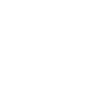

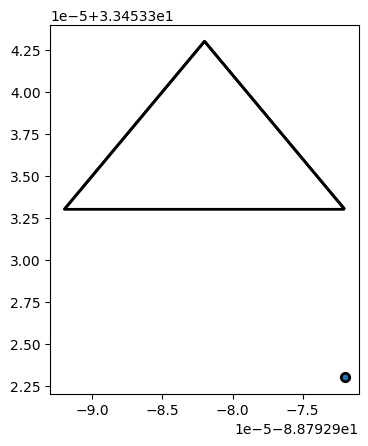

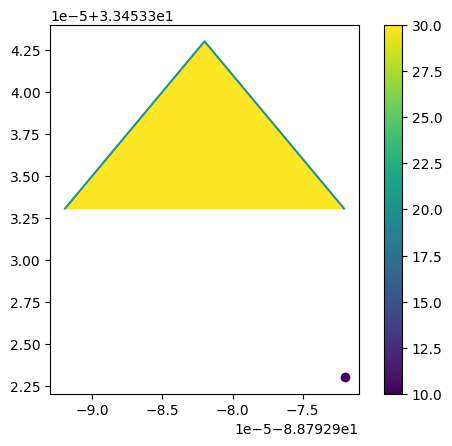

,STATEFP,COUNTYFP,COUNTYNS,AFFGEOID,GEOID,NAME,LSAD,ALAND,AWATER,geometry
0,37,017,01026336,0500000US37017,37017,Bladen,06,2265887723,33010866,"POLYGON ((-78.90200 34.83527, -78.79960 34.850..."
1,37,167,01025844,0500000US37167,37167,Stanly,06,1023370459,25242751,"POLYGON ((-80.49737 35.20210, -80.29542 35.502..."
2,39,153,01074088,0500000US39153,39153,Summit,06,1069181981,18958267,"POLYGON ((-81.68699 41.13596, -81.68495 41.277..."
3,42,113,01213687,0500000US42113,42113,Sullivan,06,1165338428,6617028,"POLYGON ((-76.81373 41.59003, -76.22014 41.541..."
4,48,459,01384015,0500000US48459,48459,Upshur,06,1509910100,24878888,"POLYGON ((-95.15274 32.66095, -95.15211 32.902..."


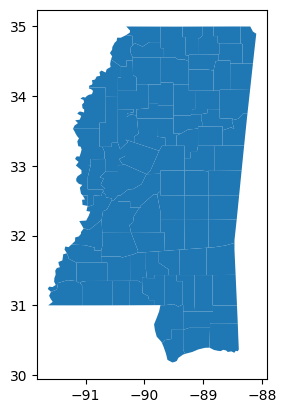

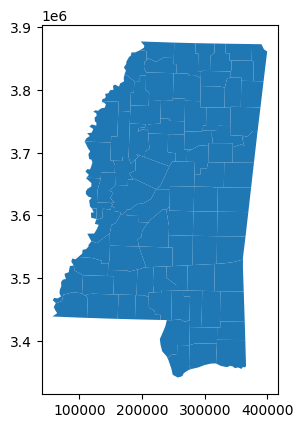

,STATEFP,COUNTYFP,COUNTYNS,AFFGEOID,GEOID,NAME,LSAD,ALAND,AWATER,geometry,county,avg_income,avg_age,population
0,28,049,00695748,0500000US28049,28049,Hinds,06,2252697076,19450105,"POLYGON ((148567.197 3571491.877, 151245.417 3...",Hinds,50000,35,200000
1,28,105,00695775,0500000US28105,28105,Oktibbeha,06,1186831624,9568768,"POLYGON ((306070.347 3712277.418, 306071.132 3...",Oktibbeha,60000,30,100000
2,28,089,00695768,0500000US28089,28089,Madison,06,1850581711,71295137,"POLYGON ((176088.403 3609292.360, 180333.943 3...",Madison,80000,45,400000
3,28,121,00695781,0500000US28121,28121,Rankin,06,2008615552,79136591,"POLYGON ((193000.253 3561837.331, 198777.758 3...",Rankin,70000,40,300000
4,28,075,00695761,0500000US28075,28075,Lauderdale,06,1822458570,29780252,"POLYGON ((320291.112 3606006.706, 369602.675 3...",Lauderdale,40000,50,500000


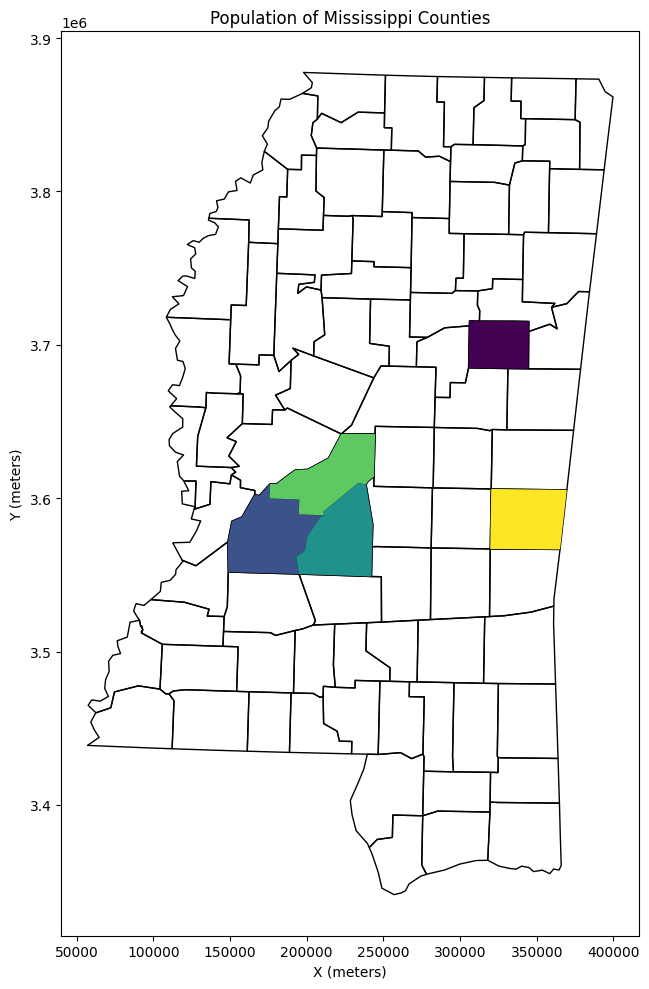

Average area of Mississippi counties: 1505025316.27986 meters squared
Total area of Mississippi counties: 123412075934.94852 meters squared


In [267]:
import geopandas as gpd

my_gs = gpd.GeoSeries([my_point, my_line, my_polygon], crs='4326') # make sure we define the CRS

# union of all geometries in the GeoSeries
my_gs_union = my_gs.unary_union
display(my_gs_union)

# Like Pandas, GeoPandas plotting functions that can be used to visualize data
gpd.plotting.plot_series(my_gs, edgecolor='black', facecolor='none', linewidth=2)

# we can create a GeoDataFrame to assign attributes to each geometry
my_gdf = gpd.GeoDataFrame(
    data={
        'name': ['my_point', 'my_line', 'my_polygon'],
        'value': [10, 20, 30]
    },
    geometry=my_gs
)

# Now we can create a plot of the GeoDataFrame and color the geometries based on the 'value' column
my_gdf.plot(column='value', legend=True)
plt.show()

# geopandas can load data from shapefiles
counties_gdf = gpd.read_file('data/cb_2018_us_county_20m/cb_2018_us_county_20m.shp')

display(counties_gdf.head())
# we can manipulate the data in the GeoDataFrame like we would a Pandas DataFrame

ms_counties_gdf = counties_gdf[counties_gdf['STATEFP'] == '28'] # select only Mississippi counties (FP code 28)
ms_counties_gdf.plot()

# Geopandas can convert between CRSs using the `to_crs` method
ms_counties_gdf = ms_counties_gdf.to_crs('epsg:32616') # convert to UTM Zone 16N

# plot to show the difference in the x and y axes
ms_counties_gdf.plot()
plt.show()

# We can join GeoDataFrames to other DataFrames using the `merge` method
my_df['county'] = my_df['county'].str.title() # make sure the county names are capitalized
ms_county_data = ms_counties_gdf.merge(
    my_df, # DataFrame to merge
    left_on='NAME', # column in left GeoDataFrame to join on
    right_on='county', # column in right DataFrame to join on
    how='inner' # type of join to perform
)
display(ms_county_data.head())

# Now we can make a fancy plot of the data
fig, ax = plt.subplots(1, 1, figsize=(10, 10))

# plot the Mississippi counties, pass in the `ax` object so we can overlay other 
# plots and configure the plot
ms_counties_gdf.plot(ax=ax, facecolor='none',) # plot all counties
ms_county_data.plot(ax=ax, column='population') # plot counties we have data for, color by population

ax.set_aspect('equal') # make sure x and y axes have same scale
ax.set_xlabel('X (meters)')
ax.set_ylabel('Y (meters)')
ax.set_title('Population of Mississippi Counties')

fig.tight_layout()
plt.show()

# Can look at spatial statistics as well
print('Average area of Mississippi counties:', ms_counties_gdf.area.mean(), 'meters squared')
print('Total area of Mississippi counties:', ms_counties_gdf.area.sum(), 'meters squared')

### Raster data

Now that we've seen some examples of working with vector data, let's move on to raster data. Raster data is represented as a grid of pixels with each pixel corresponding to a unique value. Rasters are very similar to standard imagery in that they are a multi-dimensional array of data. This makes them suitable for storing continuous data such as imagery and elevation data. Rasters can have multiple "channels" (referred to as bands) that effectively represent different layers of data. The most common type of raster data is aerial and satellite data, where each band consists of a different wavelength of light captured by the sensor (i.e., red, green, blue, near-infrared, etc.). Rasters are not limited to imagery - they can represent any continuous data that can be stored as a grid of values in addition to some discrete data types (such as land use and land cover data). On the other hand, raster data is somewhat more challenging to work with than vector data owing to the large size of the data and the difficulty in visualizing and the added transformations necessary to properly georeference the data. In this section, we will examine some common libraries for loading raster data into Python and performing basic operations on the data.

#### GDAL

The Geospatial Data Abstraction Library (GDAL) is one of the most common libraries for interacting with raster data. It is a C++ library that provides an abstract data model that is widely used across a variety of applications for reading, writing, and transforming raster data. While GDAL is a C++ library, it has Python bindings that allow users to leverage its functionality within Python.

Size is 11599 x 13904 x 4
Raster has 4 bands
Projection is PROJCS["WGS 84 / Pseudo-Mercator",GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM["Greenwich",0,AUTHORITY["EPSG","8901"]],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AUTHORITY["EPSG","4326"]],PROJECTION["Mercator_1SP"],PARAMETER["central_meridian",0],PARAMETER["scale_factor",1],PARAMETER["false_easting",0],PARAMETER["false_northing",0],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH],EXTENSION["PROJ4","+proj=merc +a=6378137 +b=6378137 +lat_ts=0 +lon_0=0 +x_0=0 +y_0=0 +k=1 +units=m +nadgrids=@null +wktext +no_defs"],AUTHORITY["EPSG","3857"]]
Geotransform is (-9886563.026870845, 0.6000000000000321, 0.0, 3961861.2086821054, 0.0, -0.5999999999999933)
Shape of the band array is (13904, 11599)
Band data type is uint8
Band min-max is 0 - 255


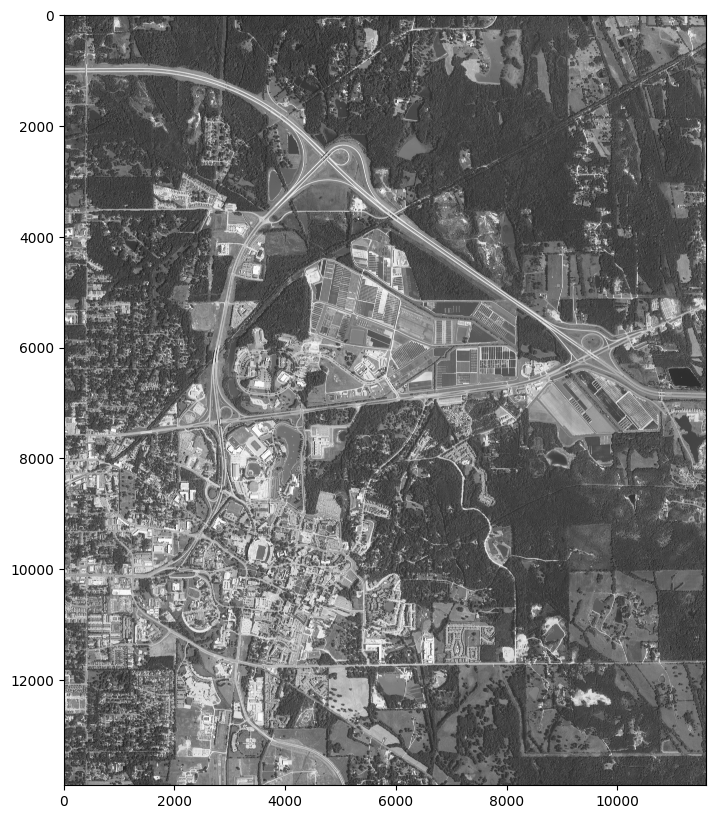

Shape of the data array is (13904, 11599, 4)
Data type is uint8
Data min-max is 0 - 255


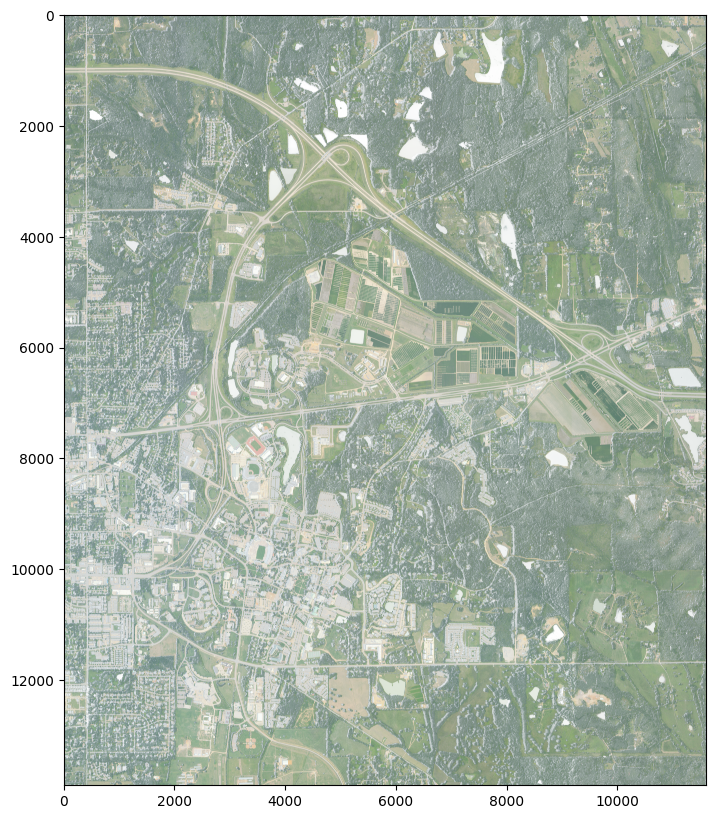

In [268]:
from osgeo import gdal

# open a raster dataset
dataset = gdal.Open('./data/m_3308834_ne_16_060_20230820.jp2')

# look at dataset properties

print(f'Size is {dataset.RasterXSize} x {dataset.RasterYSize} x {dataset.RasterCount}')
print(f'Raster has {dataset.RasterCount} bands') # Number of bands in the raster
print(f'Projection is {dataset.GetProjection()}') # CRS of the raster
print(f'Geotransform is {dataset.GetGeoTransform()}') # Will go over this later

# read the data from the raster into a numpy array
band = dataset.GetRasterBand(1).ReadAsArray() # get the first band (red in this case

print(f'Shape of the band array is {band.shape}')
print(f'Band data type is {band.dtype}')
print(f'Band min-max is {band.min()} - {band.max()}')

fig, ax = plt.subplots(1, 1, figsize=(10, 10))
ax.imshow(band, cmap='gray') # plot the data
plt.show()

# read all bands into a 3-D numpy array
data = np.stack([dataset.GetRasterBand(i).ReadAsArray() for i in range(1, dataset.RasterCount + 1)], axis=-1) # iterate over all bands and stack them along the last axis

print(f'Shape of the data array is {data.shape}')
print(f'Data type is {data.dtype}')
print(f'Data min-max is {data.min()} - {data.max()}')

# plot the data
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
ax.imshow(data) # plot the data
plt.show()

##### Affine transforms

Earlier we discussed the concept of projections and CRSs and why they are useful for vector data. Raster data also uses a CRS, but also need to know where to place the data on the 2-D plane defined by the CRS. This often done using an Affine transformation matrix. A raster's Affine transform defines where the data is located in the CRS, how the data is oriented or rotated, and how the data is scaled. The Affine transform is a 2-D 3x3 matrix that defines how to transform pixel coordinates to CRS coordinates.

The details of the Affine transform are beyond the scope of this notebook, but I highly encourage you to read up on them as they are a fundamental concept in raster data analysis. [Here is a great article on the topic](https://pygis.io/docs/d_affine.html) that explains the concept in more detail with a focus on geospatial data applications.

The Affine transformation matrix (as it pertains to raster data) is often defined as:
```
A = | a b c |
    | d e f |
    | 0 0 1 |
```

Typically, we store the Affine transform as a tuple of 6 values: (a, b, c, d, e, f). Often, the most critical parameters of the Affine transform are the pixel size (a, e) and the upper-left corner of the raster (c, f). The pixel size defines the size of each pixel in the CRS: if we are working in a CRS which has units in meters, then you can think of (a, e) as the spatial resolution of the raster. The Affine matrix makes it simple for us to georeference the raster data such that the pixels in the raster correspond to a specific location in the CRS (and consequently, the real world). There other methods for georeferencing raster data, but the Affine transform is by far the most common. Rational polynomial coefficients (RPCs) are another method for georeferencing raster data, but they are less common since they are considerably more complex and require more information to define, though they are more accurate and can account for more complex transformations than the Affine transform - especially for aerial and satellite imagery that is captured from a moving platform and must be orthorectified to account for distortions that arise from the angle of the sensor and topography of Earth's surface and other structures. Orthorectification is yet another complex topic that is beyond the scope of this notebook, but it is a critical component of working with remote sensing data to ensure the data is representative of real world objects. For more information on orthorectification, see this [blog post](https://up42.com/blog/how-to-perform-orthorectification-a-practical-guide).

In [269]:
# load the affine transformtation matrix

transform = dataset.GetGeoTransform()
print(f'Geotransform is {transform}')
print(f'Affine transformation matrix in 3x3 form is\n{np.array([[transform[1], transform[2], transform[0]], [transform[4], transform[5], transform[3]], [0, 0, 1]])}')
print(f'Pixel size is {transform[1]} x {transform[5]} meters') # pixel size in y direction is negative by convention

# close the dataset - we are done for now
dataset = None

Geotransform is (-9886563.026870845, 0.6000000000000321, 0.0, 3961861.2086821054, 0.0, -0.5999999999999933)
Affine transformation matrix in 3x3 form is
[[ 6.00000000e-01  0.00000000e+00 -9.88656303e+06]
 [ 0.00000000e+00 -6.00000000e-01  3.96186121e+06]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]
Pixel size is 0.6000000000000321 x -0.5999999999999933 meters


#### Rasterio

GDAL provides a wealth of functions, data types, and methods for working with raster data and is indeed the standard for working with raster data. However, it is not without its caveats

* GDAL is a large library which makes it relatively daunting to use. Often, GDAL functions are too low-level for most workflows. What typically ends up happening is that users spend a lot of time writing boilerplate code to perform common tasks.
* The GDAL library is written in C++, and the Python bindings are not always the most user-friendly. Like matplotlib, a major criticism of the library is its syntax, which can be overly verbose for Python scripts. It is a useful tool to learn since it is so widely used, but is not always the best choice for most basic raster operations.

Rasterio addresses these problems by serving as a wrapper around GDAL that simplifies the process of reading and writing raster data. It provides a more Pythonic interface for raster data that is easier to use and understand. Under the hood, Rasterio uses GDAL to perform most of its operations, but it abstracts away much of the complexity of GDAL. Thus, it is now commonplace in geospatial data workflows.

The choice of whether to use GDAL directly or Rasterio is often a matter of user preference. If you are new to geospatial data work, then I recommend Rasterio as its syntax is more inline with standard Python file operations. However, they may be situations where you need to perform more complex operations that are not supported by Rasterio, in which case you may need to use GDAL directly.

Shape of the data array is (4, 13904, 11599)
Data type is uint8
Data min-max is 0 - 255
Data metadata: {'driver': 'JP2OpenJPEG', 'dtype': 'uint8', 'nodata': None, 'width': 11599, 'height': 13904, 'count': 4, 'crs': CRS.from_epsg(3857), 'transform': Affine(0.6000000000000321, 0.0, -9886563.026870845,
       0.0, -0.5999999999999933, 3961861.2086821054)}
Affine transformation matrix: | 0.60, 0.00,-9886563.03|
| 0.00,-0.60, 3961861.21|
| 0.00, 0.00, 1.00|


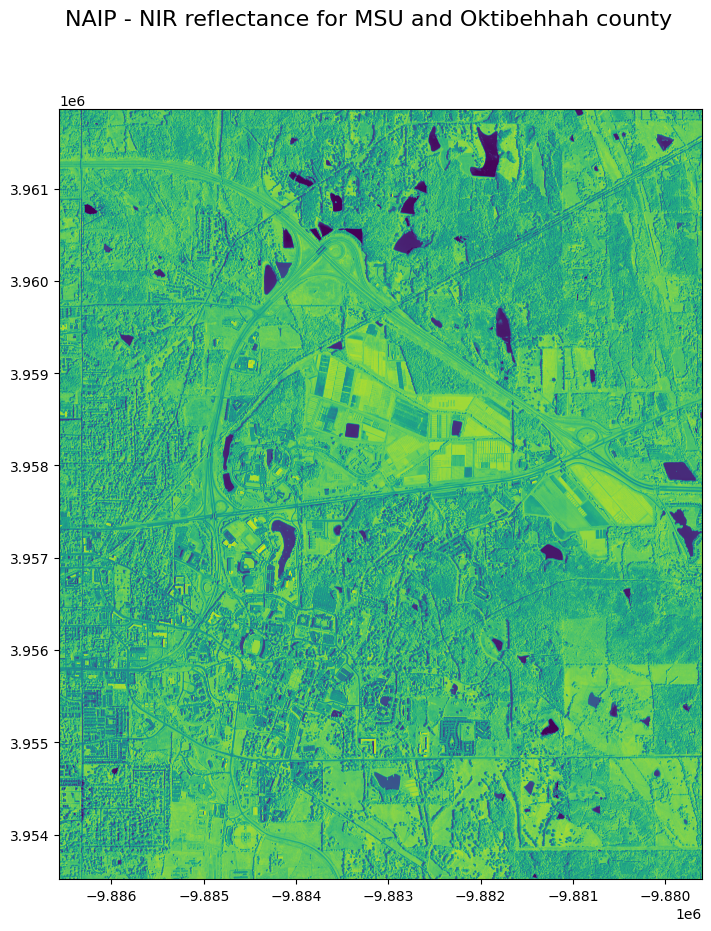

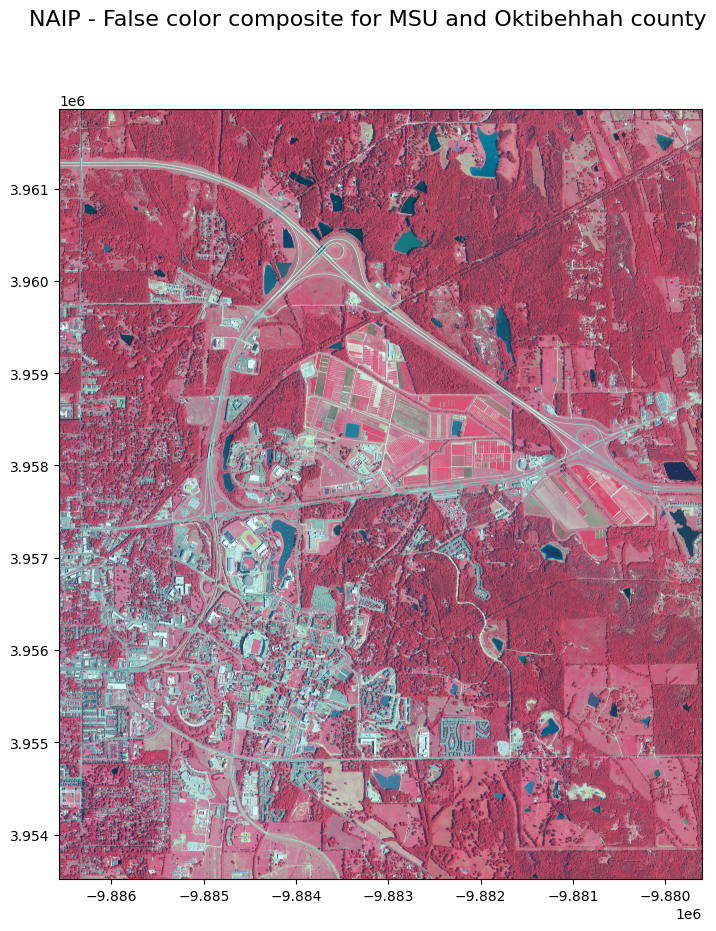

In [270]:
import rasterio as rio
from rasterio.plot import show # rasterio convenience function for plotting rasters

# use context manager to open a raster dataset - similar to standard Python file I/O
with rio.open('./data/m_3308834_ne_16_060_20230820.jp2') as dataset:
    data = dataset.read() # read all bands into a 3-D numpy array
    nir_band = dataset.read(4) # read the 4th band (NIR in this case)
    meta = dataset.meta # get metadata (CRS, transform, dtype, shape, etc.)
    transform = dataset.transform # get the affine transformation matrix directly (can also use `meta['transform']`)

print(f'Shape of the data array is {data.shape}')
print(f'Data type is {data.dtype}')
print(f'Data min-max is {data.min()} - {data.max()}')
print('Data metadata:', meta)
print('Affine transformation matrix:', transform)

# rio contains a convenience function for plotting rasters
fig, ax = plt.subplots(1, 1, figsize=(10, 10))

show(nir_band, ax=ax, cmap='viridis', transform=transform) # plot the NIR band

fig.suptitle('NAIP - NIR reflectance for MSU and Oktibehhah county', fontsize=16)
plt.show()

# show a false color composite of the data
fig, ax = plt.subplots(1, 1, figsize=(10, 10))

show(data[[3, 0, 1], ...], ax=ax, transform=transform) # plot the NIR, R, and G bands
fig.suptitle('NAIP - False color composite for MSU and Oktibehhah county', fontsize=16)
plt.show()

## Example - Clipping a raster and vector data for deep learning training

Deep learning is a powerful tool for extracting complex relationships from data. In the context of geospatial data, deep learning can be used to classify land use, identify objects, capture meaningful changes in inputs, and much *much* more. Deep learning models designed for image data require that the the imagery be in a specific format - typically a set of images that are all the same size with corresponding annotation data. For geospatial data, we often need to clip the imagery and rasterize our annotation features to create the training data for our model. In this example, we'll use the libraries we discussed earlier to create some training data for a deep learning model.

### First - loading the vector data

I've prepared a feature class that contains polygons representing water bodies in the image above. The polygons are stored in a geopackage. We'll load these and visualize them to ensure they are correct.

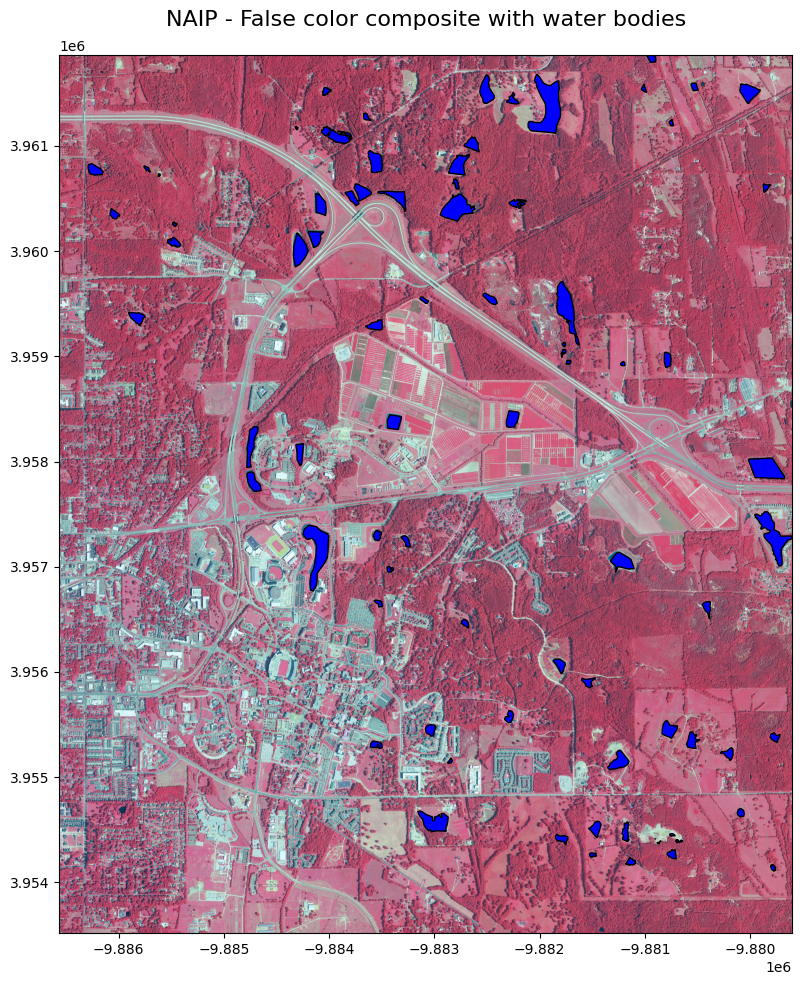

In [271]:
water_bodies_gdf = gpd.read_file('./data/water_bodies.gpkg')

# IMPORTANT - remember we need to make sure the CRS of the GeoDataFrame matches the CRS of the raster
water_bodies_gdf = water_bodies_gdf.to_crs(meta['crs'])

fig, ax = plt.subplots(1, 1, figsize=(10, 10))

# plot the raster first in color infrared
show(data[[3, 0, 1], ...], ax=ax, transform=transform) # plot the NIR, R, and G bands
water_bodies_gdf.plot(ax=ax, facecolor='blue', edgecolor='black') # overlay the water bodies

fig.suptitle('NAIP - False color composite with water bodies', fontsize=16)
fig.tight_layout()
plt.show()

### Clipping the data by grids

One approach we can take to process our data is to clip the data into smaller grids. This is a common approach for processing large datasets - by using a grid we ensure that there is no overlap between the clipped data and that each sample that we create is the same size. This would be appropriate for creating a validation or testing dataset for a deep learning model, since we want to prevent overlap between the samples.

Rasterio has a nice function that allows us to define a small window in the raster. This means we do not have to load the entire raster into memory to clip it - we can just load the region that we're interested in and save that to a file.

In [272]:
# partition the raster into 256x256 pixel tiles - we can do this in Numpy
import os

tile_size = 256
data_output_dir = './data/tiles/grid/input'
os.makedirs(data_output_dir, exist_ok=True)

with rio.open('./data/m_3308834_ne_16_060_20230820.jp2') as dataset:
    for x_offset in range(0, dataset.width, tile_size):
        for y_offset in range(0, dataset.height, tile_size):
            
            window = rio.windows.Window(
                col_off=x_offset,
                row_off=y_offset,
                width=tile_size,
                height=tile_size,
            )
            
            # only read in NIR, Red, and Green bands
            tile = dataset.read((4, 1, 2), window=window)
            
            if tile.shape[1:] != (tile_size, tile_size):
                continue # skip incomplete tiles
            
            if dataset.nodata in tile:
                continue # skip tiles with nodata values
            
            if tile.min() == tile.max():
                continue # skip tiles with no variation
            
            # update the metadata to reflect the properties of the new tile
            new_meta = meta.copy()
            new_meta['transform'] = rio.windows.transform(
                window,  # provide the window to get the transform
                dataset.transform # transform of the original raster
            ) # returns the transform of the new window
            new_meta['count'], new_meta['height'], new_meta['width'] = tile.shape # update the height and width
            new_meta['driver'] = 'GTiff' # update the driver to GeoTIFF
            new_meta['compress'] = 'lzw' # use LZW compression to minimize file size

            # save the raster 
            with rio.open(f'{data_output_dir}/tile_{x_offset}_{y_offset}.tif', 'w', **new_meta) as dst:
                dst.write(tile)


Now that we've clipped the input tiles, how do we clip the vectors and rasterize them to create a corresponding target for each tile? Thanks to Geopandas and shapely, we can do this relatively easily. We can load the vector data, clip it to the same extent as the raster, and then rasterize the polygons to create a binary mask that corresponds to the water bodies in the image. We can then save this mask to a file that corresponds to the clipped image.

In [273]:
from rasterio.features import rasterize
from glob import glob

target_dir = './data/tiles/grid/output'
os.makedirs(target_dir, exist_ok=True)

input_tiles = glob(f'{data_output_dir}/*.tif')

# keep track of tiles with data
tiles_with_data = []
for tile in input_tiles:
    
    # need to extract the x and y offsets from the tile filename
    tile_file_base = os.path.basename(tile).split('.')[0] # use .split to remove the file extension
    x_offset = tile_file_base.split('_')[1]
    y_offset = tile_file_base.split('_')[2]
    
    with rio.open(tile) as src:
        tile_bounds = src.bounds # get the bounds of the tile
    
    # print(*tile_bounds)
    
    tile_features = water_bodies_gdf.clip(tile_bounds) # clip the water bodies to the tile bounds
    
    out_file = f'{target_dir}/tile_{x_offset}_{y_offset}_water_bodies.tif'
    
    # handle the case where there are no water bodies in the tile
    if tile_features.empty:
        # create an empty numpy array with the same shape as the tile
        target_arr = np.zeros((src.height, src.width), dtype=np.uint8) # use uint8 to save space (don't need 32-bit integers)
        # print(target_arr.shape)
    
    else: # rasterize the water bodies
        target_arr = rasterize(
            [(geom, 1) for geom in tile_features.geometry], # list of geometries to rasterize
            out_shape=(src.height, src.width), # shape of the output array
            transform=src.transform, # affine transformation matrix
            fill=0, # fill value for pixels not covered by geometries
            all_touched=True, # use all pixels touched by the geometry
            default_value=1, # value to assign to pixels covered by geometries
            dtype=np.uint8 # data type of the output array
        )
        # print(target_arr.shape)
        # print(target_arr)
        tiles_with_data.append(out_file)
    
    # update the metadata to for the new target raster
    new_meta = src.meta.copy()
    new_meta['count'] = 1 # only one band
    new_meta['dtype'] = 'uint8' # data type is unsigned 8-bit integer
    new_meta['compress'] = 'lzw' # use LZW compression to minimize file size
    
    # save the raster
    with rio.open(out_file, 'w', **new_meta) as dst:
        dst.write(target_arr, 1) # write the data to the first band

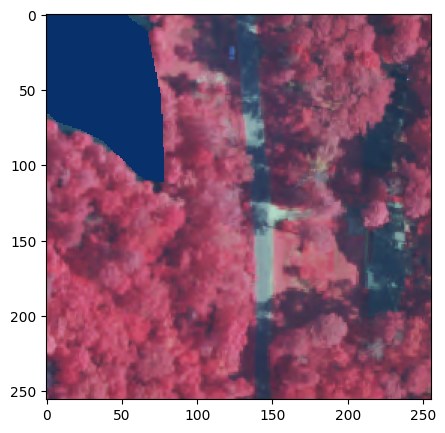

In [274]:
# lets visualize the output
out_tile = tiles_with_data[0] # get the first tile with data
x_offset = out_tile.split('_')[1] # extract the x and y offsets from the filename to load the corresponding input tile
y_offset = out_tile.split('_')[2]
in_tile = f'./data/tiles/grid/input/tile_{x_offset}_{y_offset}.tif'

# load the input and output tiles
with rio.open(in_tile) as src:
    in_data = src.read()
    in_transform = src.transform
    
with rio.open(out_tile) as src:
    out_data = src.read()
    out_transform = src.transform

# create a data mask to overlay the water bodies
data_mask = np.ma.masked_where(out_data == 0, out_data) # mask the data where the water bodies are not present

fig, ax = plt.subplots(1, 1, figsize=(5, 5))

show(in_data, ax=ax,) # plot the input imagery
ax.imshow(data_mask[0], cmap='Blues_r') # overlay the water bodies

plt.show()

### Extracting bounding boxes for object detection

We've successfully created tiles that include the input imagery cropped to a specific size and an accomanying annotation raster that corresponds to the water bodies in the image. We can train a semantic segmentation model (such as U-Net or DeepLabv3+) using this data, but what if we want to train an object detection model instead? Object detection models do not outline the precise shape of objects of interest, but they instead yield a bounding box that contains the object. In order to prepare our data for object detection, we need to extract bounding boxes and encode them in a manner that is compatible with the model we want to use. For example, [this repo](https://github.com/eriklindernoren/PyTorch-YOLOv3) provides a Pytorch implementation of YoloV3, a populat object detection model. According to the README, the model expects the object boundaries to be encoded in a text file with the following format:

> The dataloader expects that the annotation file corresponding to the image `data/custom/images/train.jpg` has the path `data/custom/labels/train.txt`. Each row in the annotation file should define one bounding box, using the syntax `label_idx x_center y_center width height`. The coordinates should be scaled `[0, 1]`, and the `label_idx` should be zero-indexed and correspond to the row number of the class name in data/custom/classes.names.

So, how do we extract bounding boxes from our annotation raster and encode them in the format expected by the model? Again, we can use geopandas and rasterio to accomplish this. We can load the source image and clip our vector data to the bounds the image, then calculate the position of the object to encode it in the format expected by the model. For simplicity sake, we will only label our objects '0' - as we only have one class.

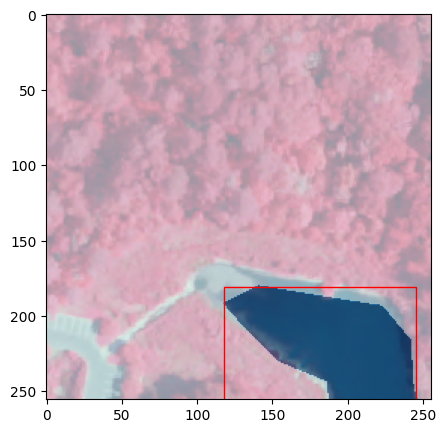

0 0.7125272063136132 0.14650894787631447 0.4982814288462839 0.29301789575262893


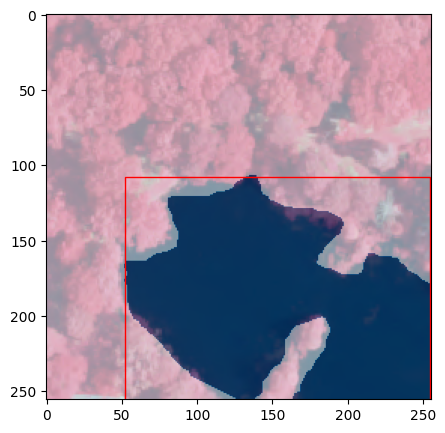

0 0.602858935958412 0.2897105415981728 0.7942821280831759 0.5794210831963456


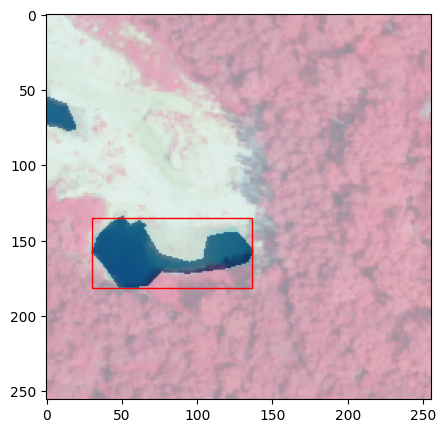

0 0.3286553619675121 0.3823663766462036 0.41581593102313685 0.18237540834877874


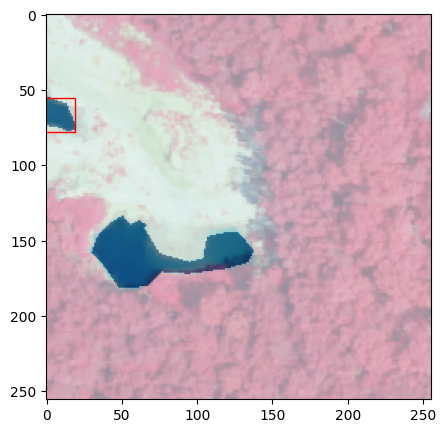

0 0.03837881125955604 0.7406687182442567 0.07675762251911208 0.08847924761837422


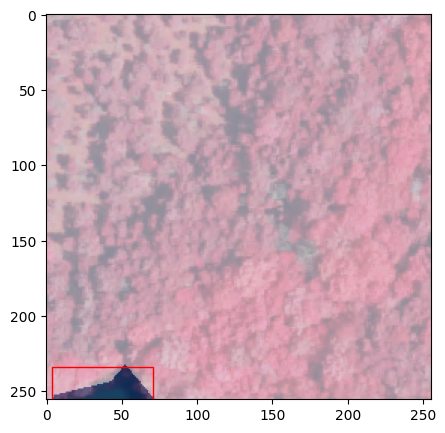

0 0.1484215167090307 0.04313378509775361 0.26060225033448803 0.08626757019550722


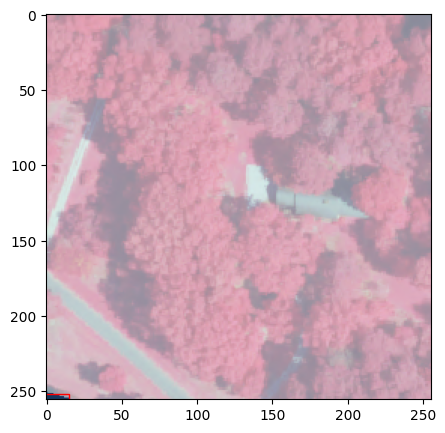

0 0.03029451550302303 0.008078537460576579 0.06058903100604606 0.016157074921153158


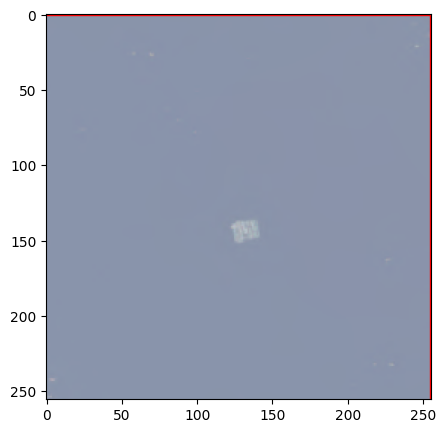

0 0.5 0.5 1.0 1.0


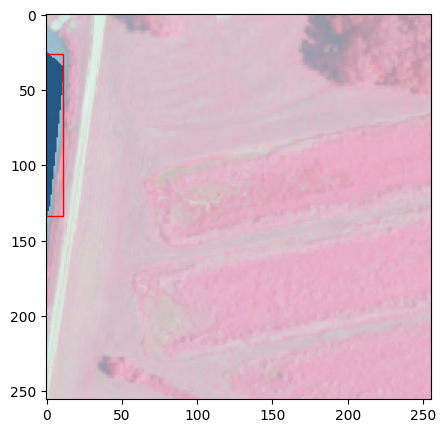

0 0.02335210438110359 0.6883277670942405 0.04670420876220718 0.4212775367732797


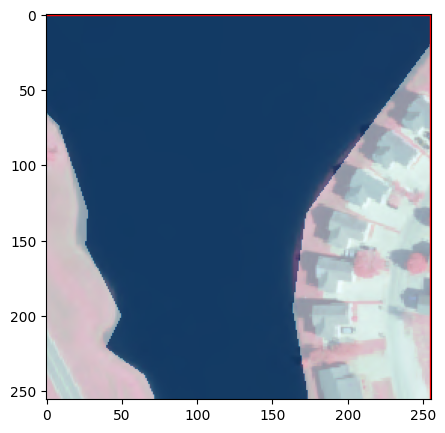

0 0.5 0.5 1.0 1.0


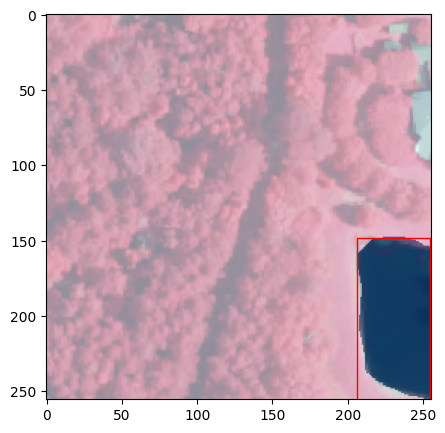

0 0.9048944775674921 0.21040464956652286 0.19021104486501572 0.4208092991330457


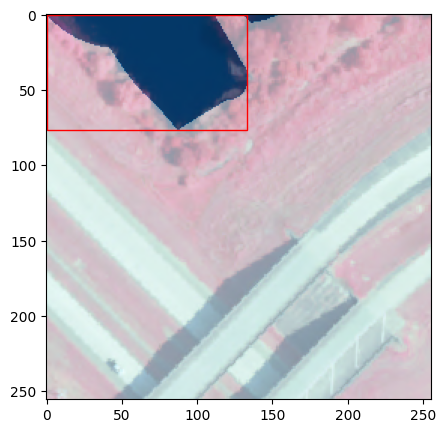

0 0.26331629136684764 0.8508419473592761 0.5183559337105019 0.2983161052814477


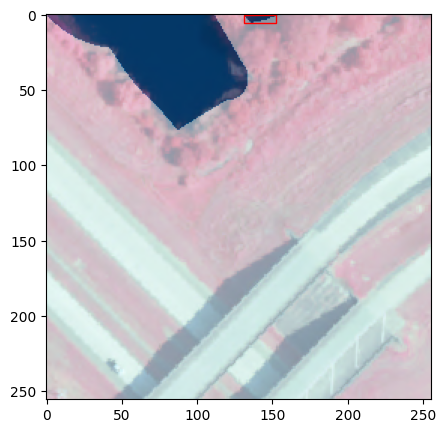

0 0.5577979822933116 0.9899545269302872 0.08271090237657264 0.020090946139425747


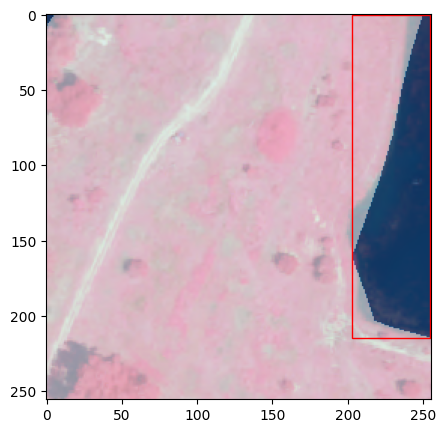

0 0.8987752496757184 0.580603520676304 0.20244950064856304 0.8387929586473918


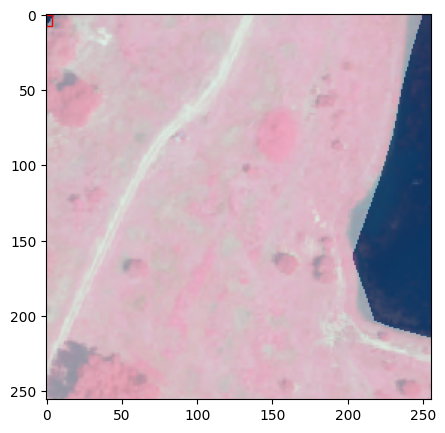

0 0.009114852431009821 0.9859771501057149 0.018229704862019643 0.0280456997885703


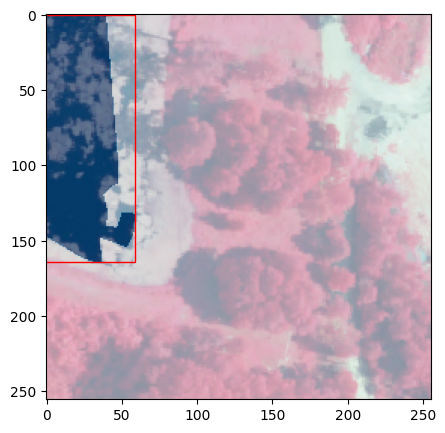

0 0.11633510369117803 0.6787225784345363 0.23267020738235605 0.6425548431309274


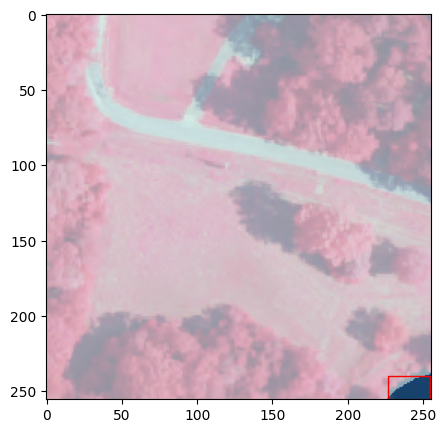

0 0.9450813680594852 0.03142671924856196 0.10983726388102955 0.06285343849712392


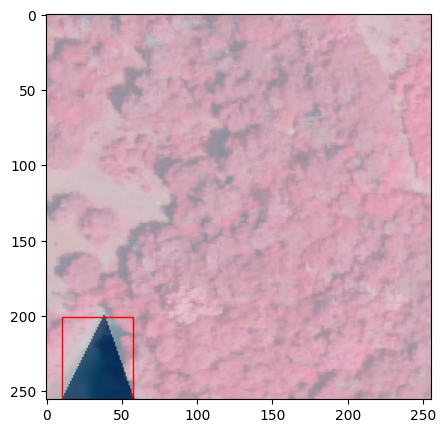

0 0.13519961441521494 0.10779894508377293 0.18415653117744213 0.21559789016754585


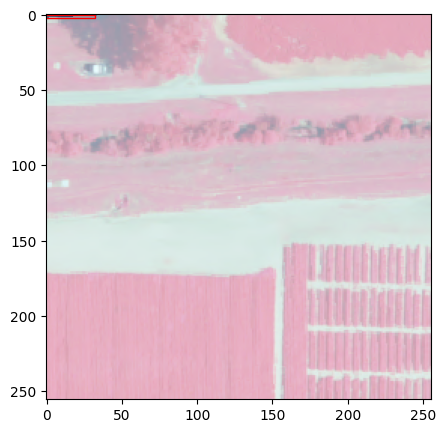

0 0.06509587605266787 0.9959315077452048 0.13019175210533573 0.00813698450959044


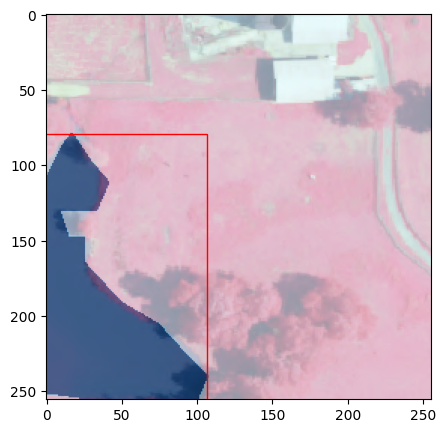

0 0.2093557208177647 0.3451452550065702 0.4187114416355294 0.6902905100131403


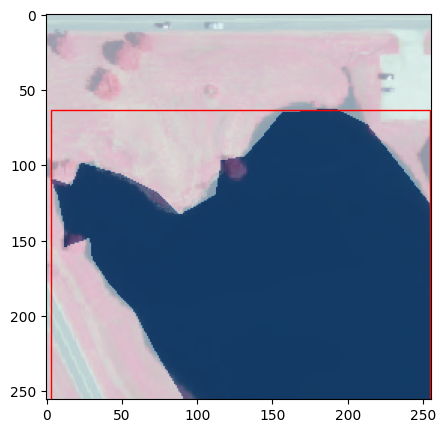

0 0.5073865245152347 0.3768600789951495 0.9852269509695306 0.753720157990299


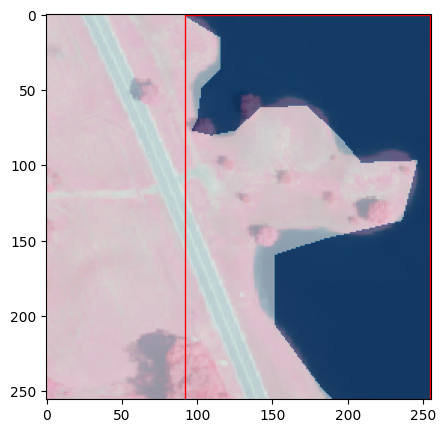

0 0.680764071689872 0.5 0.6384718566202561 1.0


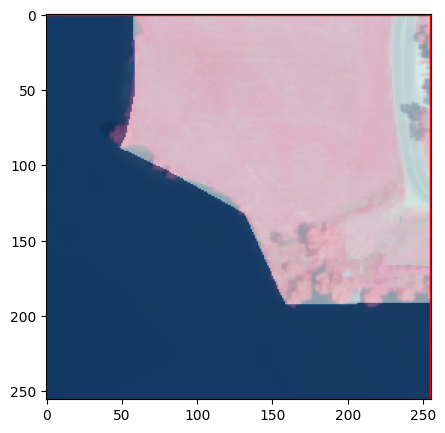

0 0.5 0.5 1.0 1.0


In [275]:
bbox_out_dir = './data/tiles/grid/bbox'
os.makedirs(bbox_out_dir, exist_ok=True)

for tile_file in tile_files:
    
    with rio.open(tile_file) as src:
        tile_bounds = src.bounds # get the bounds of the tile
        data = src.read() # read the data
        
        tile_size = data.shape # get the tile size
    
    # clip the water bodies to the tile bounds
    tile_features = water_bodies_gdf.clip(tile_bounds)
    # print(tile_features)
    
    if tile_features.empty:
        continue
    
    # assign a class label to the tile features - 0 for now since we only have water bodies
    tile_features['class'] = 0
    
    # for each water body in the tile, extract the x_center and y_center and scale it [0, 1] with respect to the tile
    for i, row in tile_features.iterrows():
        
        left_bound = row.geometry.bounds[0] # minx
        right_bound = row.geometry.bounds[2] # maxx
        bottom_bound = row.geometry.bounds[1] # miny
        top_bound = row.geometry.bounds[3] # maxy
        
        # scale bounds to [0, 1] with respect to the tile
        tile_width = tile_bounds.right - tile_bounds.left
        tile_height = tile_bounds.top - tile_bounds.bottom
        
        left_bound = (left_bound - tile_bounds.left) / tile_width
        right_bound = (right_bound - tile_bounds.left) / tile_width
        top_bound = (top_bound - tile_bounds.bottom) / tile_height
        bottom_bound = (bottom_bound - tile_bounds.bottom) / tile_height
        
        # now determine center of the bounding box
        x_center = (left_bound + right_bound) / 2
        y_center = (bottom_bound + top_bound) / 2
        
        # get the width and height of the bounding box
        width = right_bound - left_bound
        height = top_bound - bottom_bound
        
        # lets visualize the resultant bounding box
        fig, ax = plt.subplots(1, 1, figsize=(5, 5))
        show(data, ax=ax) # plot the input imagery
        # overlay bounding box
        ax.add_patch(
            plt.Rectangle(
                (
                    (x_center - (width / 2)) * tile_size[1] - 1,
                    tile_size[2] - ((y_center + (height / 2)) * tile_size[2]), # flip the y-axis (to match the rasterio plot convention)
                ), 
                width * tile_size[1], 
                height * tile_size[2], 
                edgecolor='red', 
                facecolor='none',
            )
        )
        
        # overlay annotations just to make sure we are getting the right bounding box
        with rio.open(tile_file.replace('input', 'output').replace('.tif', '_water_bodies.tif')) as src:
            show(src.read(), ax=ax, cmap='Blues', alpha=0.5)
        
        plt.show() # NOTE: bounding box is not perfect in visualization - but is correct in calculations
        
        # now we can save the bounding box information to a txt file in the format
        # label_idx x_center y_center width height
        print(f'{row["class"]} {x_center} {y_center} {width} {height}')
        with open(f'{bbox_out_dir}/{os.path.basename(tile_file).replace(".tif", ".txt")}', 'w') as f:
            f.write(f'{row["class"]} {x_center} {y_center} {width} {height}')
        

## Conclusion

As you can see, Python offers a powerful and flexible interface working with geospatial data. While desktop GIS software will suffice for creating data, visualizing data, and some basic analyses, Python enables us to perform complex tasks that would otherwise be difficult in a GIS software. What I've shown here is just a sampling of the many many things that you can do using Python. I encourage you to further explore some of the libraries I've discussed in this notebook. Below are the links to the documentation for each library:

* [Numpy](https://numpy.org/doc/stable/)
* [Pandas](https://pandas.pydata.org/docs/)
* [Matplotlib](https://matplotlib.org/stable/contents.html)
* [Shapely](https://shapely.readthedocs.io/en/stable/manual.html)
* [Pyproj](https://pyproj4.github.io/pyproj/stable/)
* [Geopandas](https://geopandas.org/docs.html)
* [GDAL](https://gdal.org/)
* [Rasterio](https://rasterio.readthedocs.io/en/latest/)

In addition, there are many other libraries that were not covered in this notebook that are also useful for working with geospatial data. Some of these include:

* [Folium](https://python-visualization.github.io/folium/latest/) - offers an interface for creating interactive maps
* [Xarray](https://docs.xarray.dev/en/stable/) - a library for working with multi-dimensional arrays. This is especially useful if you need to work with time series data.
* [rioxarray](https://corteva.github.io/rioxarray/stable/) - a library that extends Xarray to work with raster data using Rasterio as the backend.
* [Scikit-image](https://scikit-image.org/docs/stable/) - offers some advanced image processing functions that can be useful when working with aerial and satellite imagery. Designed to work with Pythonic syntax and Numpy arrays.
* [OpenCV](https://docs.opencv.org/master/) - one of the most powerful and widely-used libraries for advanced image analysis and computer vision. Written in C++ but offers Python bindings.
* [scikit-learn](https://scikit-learn.org/stable/) - a library for machine learning that offers a wide range of algorithms for classification, regression, clustering, and more. Very widely used in the data science community, but not specifically designed for geospatial data. Still, because we can represent geospatial data in Numpy arrays and Pandas/Geopandas dataframes, still highly relevant for most analysis tasks.
* [Pytorch](https://pytorch.org/docs/stable/index.html) - a deep learning library that has now become the standard for designing, training, evaluating, and deploying deep learning models.

For more tutorials on working with geospatial data, [please see our other notebooks in this series](https://vsmartins.github.io/gcersat/index.html).